In [ ]:
import numpy 
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams['font.sans-serif'] = ['SimHei']  # 或 ['Microsoft YaHei']
plt.rcParams['axes.unicode_minus'] = False    # 正常显示负号

# -*- coding: utf-8 -*-
# @Time    : 2025/6/1 21:00
# @Author  : Mike
# @File    : hanging_rope.py
# @Software: VSCode
# @Description: 计算吊绳受力
# @Version : 1.0


In [3]:
# 向量投影函数
# 计算向量 a 在向量 b 上的投影
def vector_projection(a, b):

    b_norm_sq = np.dot(b, b)
    if b_norm_sq < 1e-8:
        raise ValueError("基向量 b 的模长不能为零")
    projection = np.dot(a, b) / b_norm_sq * b
    return projection


In [4]:


#只计算绳子给两端施加的力，绳子相对吊物为小质量物体（忽略绳子质量）<--------未设置
#集中质量法构建绳子，绳子只有两个节点

class Hanging_rope:

    #绳子基本参数
    #pos[3:6]为1*6向量，lenth为float，mass为float，ea为float，gravity为float
    def __init__(self,pos,vel,length,mass,d,EA,C,gravity=9.81):
        self.pos = numpy.array(pos, dtype=float)
        self.length = length
        self.mass = mass
        self.gravity = gravity
        self.ea = EA
        self.vel = numpy.array(vel, dtype=float)
        self.C = float(C)
        self.d = float(d)
        #计算绳子受力
        self.tension_force = self.calculate_tension_force(EA,d,length, pos)
        self.global_force = self.calculate_global_force(mass, gravity)
        self.damping_force = self.calculate_damping_force(pos, vel, length, d, damping_coefficient=C)
        self.total_force = self.tension_force + self.global_force + self.damping_force
    
    def calculate_tension_force(self,EA,d,lenth,pos):

        #计算缆绳所受的张力
        #sward为一个质点的方向向量，指向另一个点
        #pos0-2是上点坐标，pos3-5是下端点坐标
        #将力输出为一个3*3的矩阵

        #初始化参数
        pos = np.array(pos,dtype=float)
        lenth = float(lenth)
        EA = float(EA)
        d = float(d)
        force = np.zeros(6,dtype=float)
        sward_before = np.zeros(3,dtype=float)
        lenth_now = float(0.0)
        sward = np.zeros(3,dtype=float)

        #计算缆绳实际长度
        sward_before= (pos[0:3] - pos[3:6])
        lenth_now = numpy.linalg.norm(sward_before)
        if lenth_now <= 1e-6:
            force = np.zeros(6, dtype=float)
            return force
        sward = sward_before / lenth_now
        #计算缆绳长度变化
        lenth_changerate = lenth_now - lenth
        #计算点所受张力
        #前三个为下端点受力，后三个为上端点受力
        if lenth_changerate >= 0: 
            force[3:6] =  1/4*numpy.pi*EA*d**2*lenth_changerate*sward
            force[0:3] = -1/4*numpy.pi*EA*d**2*lenth_changerate*sward
        else:
            force = 0
        return force
    

    def calculate_global_force(self, mass, g=9.8):
        force = np.zeros(6, dtype=float)
        g_force = np.array([0, 0, -0.5 * float(mass) * float(g)], dtype=float)
        force[0:3] = g_force
        force[3:6] = g_force
        return force
    
    def calculate_damping_force(self,pos,vel,length,d,damping_coefficient=0.1):
        #法向阻尼，沿绳子长度方向
        #计算缆绳的阻尼力
        #pos,vel为6*1向量，damping_coefficient为阻尼系数
        #返回一个6*1向量
        pos = np.array(pos, dtype=float)
        vel = np.array(vel, dtype=float)
        length = float(length)
        damping_coefficient = float(damping_coefficient)
        epsilon_topnode = epsilon_endnode = np.zeros(3, dtype=float)
        #相对速度
        rel_vol = np.zeros(6, dtype=float)
        #相对位置
        rel_pos = np.zeros(6, dtype=float)
        #力
        force = np.zeros(6, dtype=float)

        #计算相对位置和速度
        rel_pos[0:3] = pos[0:3] - pos[3:6]
        rel_pos[3:6] = pos[3:6] - pos[0:3]
        rel_vol[0:3] = vel[0:3] - vel[3:6]
        rel_vol[3:6] = vel[3:6] - vel[0:3]
        #epsilon为单位向量
        epsilon_endnode =np.dot (rel_pos[0:3],rel_vol[0:3])  /  (numpy.linalg.norm(rel_pos[0:3])*length)
        epsilon_topnode = np.dot (rel_pos[3:6],rel_vol[3:6])  /  (numpy.linalg.norm(rel_pos[3:6])*length)

        #计算单位向量
        sward = rel_pos[0:3] / numpy.linalg.norm(rel_pos[0:3])
        #计算法向阻尼力
        #阻尼力方向与相对速度方向相反
        force[3:6] =  damping_coefficient * np.pi * 0.25 * d**2 * epsilon_endnode * sward
        force[0:3] =  -damping_coefficient * np.pi * 0.25 * d**2 * epsilon_topnode * sward
        #将力转换为6*1向量

        #计算切向阻尼力
        #定义投影参数和向量
        vel_prep = np.zeros(6, dtype=float)
        #计算速度在绳子方向上的投影
        tangential_velocity = vector_projection(rel_vol[0:3], rel_pos[0:3])
        #计算速度在切向上的投影
        vel_prep[0:3] = rel_vol[0:3] - tangential_velocity
        vel_prep[3:6] = - vel_prep[0:3]
        #计算切向单位向量
        if np.linalg.norm(vel_prep[0:3]) == 0:
            #print("Warning: Tangential velocity is zero, cannot compute direction.")
            return force
        sward_prep =    vel_prep[0:3] / np.linalg.norm(vel_prep[0:3])
        #print("sward_prep:", sward_prep)
        #计算切向阻尼力参数
        epsilon_endnode_prep =np.dot (vel_prep[0:3],rel_vol[0:3])  /  (numpy.linalg.norm(rel_pos[0:3])*length)
        epsilon_topnode_prep = np.dot (vel_prep[3:6],rel_vol[3:6])  /  (numpy.linalg.norm(rel_pos[3:6])*length)
        #print("epsilon_endnode_prep:", epsilon_endnode_prep,sward_prep)
        #计算切向阻尼力
        force[3:6] +=  10 * damping_coefficient * np.pi * 0.25 * d**2 * epsilon_endnode_prep * sward_prep
        #force[0:3] += - 10*damping_coefficient * np.pi * 0.25 * d**2 * epsilon_topnode_prep * sward_prep

        return force
    



    

In [5]:
class Hook:
    def __init__(self, pos, vel, hook_mass, line_mass, line_force, gravity=9.81):
        self.pos = np.array(pos, dtype=float)
        self.vel = np.array(vel, dtype=float)
        self.hook_mass = float(hook_mass)
        self.line_mass = float(line_mass)
        self.gravity = gravity
        self.line_force = np.array(line_force, dtype=float)
        self.force = self.calculate_force()
        # 计算吊钩的加速度
        self.acc = self.calculate_acceleration()
    
    def calculate_force(self):
        """
        计算吊钩所受的总力（这里只计算重力，假定重力作用于吊钩和连接线）
        """
        #total_mass = self.hook_mass + self.line_mass * 0.5  # 假设吊钩和连接线的质量平均分配
        # 重力方向指向负 z 轴
        g_force = np.array([0, 0, -self.hook_mass * self.gravity], dtype=float)
        line_force = self.line_force[3:6]  # 假设线的力作用在吊钩上
        # 计算总力
        total_force = g_force + line_force
        return total_force
    
    def calculate_acceleration(self):
        """
        根据牛顿第二定律计算加速度: a = F / m
        """
        total_mass = self.hook_mass + self.line_mass * 0.5  # 假设吊钩和连接线的质量平均分配
        if total_mass == 0:
            return np.zeros_like(self.force)
        acceleration = self.force / total_mass
        return acceleration


In [6]:
    #创建对应的函数关系，对x求二阶导等于对v求一阶导，=acc
def acc_func(pos, vel, length, line_mass, d, EA, C,hook_mass):
        rope = Hanging_rope(pos, vel, length, line_mass, d, EA, C)
        # 计算吊钩受力
        line_force = rope.total_force
        #print("绳子顶端拉力:", line_force[0:3])
        #print("吊绳底端拉力",line_force[3:6])
        #受力计算加速度
        hook = Hook(pos, vel, hook_mass, line_mass, line_force )
        #print("加速度:",hook.acc)
        #print("c_force:",rope.damping_force)
        return np.array(hook.acc)

In [12]:
def rk4(pos, vel, length, line_mass, d, EA, C,hook_mass, t0, h):
    #龙格库塔开始时间
    pos_down = pos[3:6]
    vel_down = vel[3:6]
    vel1 = vel2 = vel3 = vel
    t = t0
    #初始化为flot类型的值
    # x0 = np.array(x0, dtype=float).flatten()
    # v0 = np.array(v0, dtype=float).flatten()

    #将位移，速度结合成一个向量
    #位移的维数
    #转化为一阶微分方程<--------没看懂

    #龙格库塔四阶求速度
    k1 = acc_func(pos, vel, length, line_mass, d, EA, C,hook_mass)
    vel1[3:6] = vel_down + k1 * 0.5*h
    pos[3:6] = pos_down + vel_down * h + k1 * h * h * 0.5* 0.5*0.5
    k2 = acc_func(pos, vel1, length, line_mass, d, EA, C,hook_mass)
    vel2[3:6] = vel_down + k2 * 0.5 * h
    pos[3:6] = pos_down + vel_down * h + k2 * h * h * 0.5* 0.5* 0.5
    k3 = acc_func(pos, vel2, length, line_mass, d, EA, C,hook_mass)
    vel3[3:6] = vel_down + k3 * h
    pos[3:6] = pos_down + vel_down * h + k3 * h * h*0.5
    k4 =  acc_func(pos, vel3, length, line_mass, d, EA, C,hook_mass)
    vel[3:6] = vel[3:6]+ (k1 + 2*k2 + 2*k3 + k4) * h / 6.0
    pos[3:6] = pos_down + vel_down * h + (k1 + 2*k2 + 2*k3 + k4) * h / 6.0 * h*0.5
    t = t0+h
    return t, vel, pos

t=0.0010 
 上端点位置: [0. 0. 0.] 
 下端点位置: [  0.           0.         -19.99986091] 
 速度: [0.         0.         0.05383157]
t=0.0020 
 上端点位置: [0. 0. 0.] 
 下端点位置: [  0.           0.         -19.99950709] 
 速度: [0.         0.         0.10743736]
t=0.0030 
 上端点位置: [0. 0. 0.] 
 下端点位置: [  0.           0.         -19.99893942] 
 速度: [0.         0.         0.16081652]
t=0.0040 
 上端点位置: [0. 0. 0.] 
 下端点位置: [  0.           0.         -19.99815882] 
 速度: [0.         0.         0.21396822]
t=0.0050 
 上端点位置: [0. 0. 0.] 
 下端点位置: [  0.           0.         -19.99716621] 
 速度: [0.         0.         0.26689163]
t=0.0060 
 上端点位置: [0. 0. 0.] 
 下端点位置: [  0.          0.        -19.9959625] 
 速度: [0.         0.         0.31958594]
t=0.0070 
 上端点位置: [0. 0. 0.] 
 下端点位置: [  0.          0.        -19.9945486] 
 速度: [0.         0.         0.37205035]
t=0.0080 
 上端点位置: [0. 0. 0.] 
 下端点位置: [  0.           0.         -19.99292544] 
 速度: [0.         0.         0.42428408]
t=0.0090 
 上端点位置: [0. 0. 0.] 
 下端点位置: [  0.   

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial Unicode MS
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial Unicode MS
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial Unicode MS
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial Unicode MS
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial Unicode MS
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial Unicode MS
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial Unicode MS
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial Unicode MS
findfont: Generic family 'sans-serif' not found because none of the foll

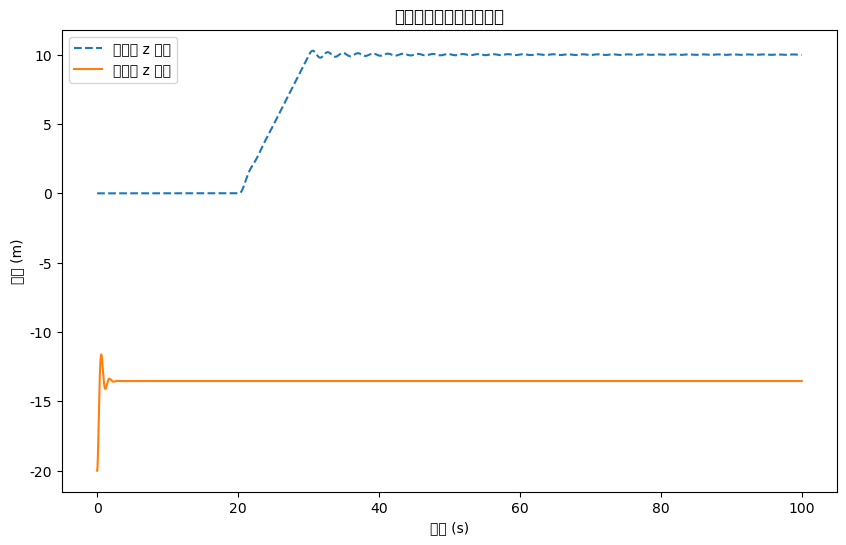

In [13]:
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams["font.sans-serif"] = ["Arial Unicode MS"]  # 使用支持中文的字体
plt.rcParams["axes.unicode_minus"] = False            # 解决负号 '-' 显示为方块的问题
# 导入你项目中的相关模块，如果它们在其他文件中，请按实际情况修改导入路径


# 初始化参数
pos = np.array([0, 0, 0, 0, 0, -20], dtype=float)  # 上端点（前 3 个元素）和下端点（后三个元素）坐标
vel = np.array([0, 0, 0, 0, 0, 0], dtype=float)     # 速度
length = 10.0              # 绳子长度
line_mass = 5.0            # 绳子质量
hook_mass = 70700.0          # 吊钩质量
EA = 100000000.0               # 弹性模量乘以截面积
C = 500000000                      # 阻尼系数
d = 0.05                   # 绳子直径
t = 0                      # 初始时间

# 用于保存数据
time_list = []
top_z_list = []
bottom_z_list = []

while t < 100:
    if t > 20 and t < 30:
        pos[0] += 0.001
    # rope = Hanging_rope(pos, vel, length, line_mass, d, EA, C)
    # line_force = rope.total_force
    # hook = Hook(pos, vel, hook_mass, line_mass, line_force)
    
    # 记录当前时刻和端点位移（这里记录 z 坐标，pos[2]为上端，pos[5]为下端）
    time_list.append(t)
    top_z_list.append(pos[3])
    bottom_z_list.append(pos[5])
    
    # 使用 rk4 计算下端点的位移和速度更新
    t, vel, pos = rk4(pos, vel, length, line_mass, d, EA, C,hook_mass, t, h=0.001)
    print(f"t={t:.4f} \n 上端点位置: {pos[0:3]} \n 下端点位置: {pos[3:6]} \n 速度: {vel[3:6]}")


# 绘图
plt.figure(figsize=(10, 6))
plt.plot(time_list, top_z_list, label="上端点 z 坐标", linestyle="--")
plt.plot(time_list, bottom_z_list, label="下端点 z 坐标", linestyle="-")
plt.xlabel("时间 (s)")
plt.ylabel("位移 (m)")
plt.title("绳子端点位移随时间变化")
plt.legend()
plt.show()

In [21]:
import numpy

ans = float(0.0)
ans= 2*numpy.pi*numpy.sqrt(5/(1000000000/10))
print(f"绳子端点位移随时间变化的周期近似为: {ans:.10f} 秒")

绳子端点位移随时间变化的周期近似为: 0.0014049629 秒
